# AI_campus_ProstateSeg 
# Module 10: Image Segmentation Using Softmax Classifier
### PANDA: Prostate cANcer graDe Assessment (PANDA) Challenge

In this module, we will develop a basic machine learning model to obtain segmentation results for the images. This model can serve as a baseline for more advanced models that use convolutions, such as U-Net, or transformers for image segmentation. Since each image can be represented as a (H, W, 3) tensor -- with three channels for R, G, and B -- we can feed in the RGB vectors that characterize each pixel into a softmax classifier, which outputs a probability distribution for that pixel to belong to each of the five possible classes. This type of a model ignores the spatial relationships and spatial distribution of the pixels in an image, effectively treating each pixel independently -- regardless of its position in the image, or with respect to the positions and types of neighboring pixels. 

### 1. Import the necessary packages

In [1]:
import os
import tifffile
import numpy as np
import matplotlib.pyplot as plt
import panda_utils as putil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import cv2

from PIL import Image
from typing import List, Set, Union, Optional, Dict, Tuple
from torch.utils.data import Dataset, DataLoader
from dataclass import ToyPANDASDataset
from torchvision.transforms import functional as Fv
from scipy.stats import entropy
from normalizers import ChannelWiseMinMaxNormalizer
from sklearn.cluster import MeanShift
from sklearn.preprocessing import MinMaxScaler

### 2. Define folder and subdirectory folder names

In [2]:
ROOT_FOLDER = "sample_data"
IMAGE_SUBFOLDER = "train_images"
MASK_SUBFOLDER = "train_label_masks"

image_dir = os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER)
mask_dir = os.path.join(ROOT_FOLDER, MASK_SUBFOLDER)

### 3. Create list of image and mask files and print contents

In [4]:
image_files = list(filter(lambda file: file != '.ipynb_checkpoints', sorted(os.listdir(image_dir))))
mask_files = list(filter(lambda file: file != '.ipynb_checkpoints', sorted(os.listdir(mask_dir))))

In [5]:
image_files

['0018ae58b01bdadc8e347995b69f99aa.tiff',
 '004dd32d9cd167d9cc31c13b704498af.tiff',
 '0068d4c7529e34fd4c9da863ce01a161.tiff',
 '006f6aa35a78965c92fffd1fbd53a058.tiff',
 '007433133235efc27a39f11df6940829.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a.tiff',
 '008069b542b0439ed69b194674051964.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb.tiff',
 '00951a7fad040bf7e90f32e81fc0746f.tiff',
 '00a26aaa82c959624d90dfb69fcf259c.tiff']

In [6]:
mask_files

['0018ae58b01bdadc8e347995b69f99aa_mask.tiff',
 '004dd32d9cd167d9cc31c13b704498af_mask.tiff',
 '0068d4c7529e34fd4c9da863ce01a161_mask.tiff',
 '006f6aa35a78965c92fffd1fbd53a058_mask.tiff',
 '007433133235efc27a39f11df6940829_mask.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a_mask.tiff',
 '008069b542b0439ed69b194674051964_mask.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb_mask.tiff',
 '00951a7fad040bf7e90f32e81fc0746f_mask.tiff',
 '00a26aaa82c959624d90dfb69fcf259c_mask.tiff']

### 4. Load and print out the dimensions of each of the image files contained in the image folder

In [7]:
for image_file in image_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))
    print(img.shape)

(25344, 5888, 3)
(22528, 8192, 3)
(10496, 6912, 3)
(7680, 2048, 3)
(24320, 9472, 3)
(14848, 11776, 3)
(8704, 23808, 3)
(36352, 10752, 3)
(8192, 11520, 3)
(20736, 18688, 3)


The images above follow a (H, W, 3) format with three channels for R, G, and B. We need to re-cast them into a N by 3 matrix where N corresponds to the number of pixels or points present in the image and 3 corresponds to R, G, and B values in a three-dimensional vector that represents each point or pixel. Sample a test image. 

In [8]:
test_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_files[0]))

Print shape of test image. 

In [9]:
test_image.shape

(25344, 5888, 3)

Apply re-shape operation to make tensor compatible with softmax classification model. 

In [10]:
print(f"Number of points or pixels present in the image: {test_image.shape[0] * test_image.shape[1]}")

Number of points or pixels present in the image: 149225472


In [ ]:
reshaped_image = test_image.reshape(-1, 3) #  Reshape from (H, W, 3) to (H×W, 3)

Print dimensionality of reshaped image.

In [136]:
reshaped_image.shape

(149225472, 3)

Print length of reshaped_image

In [137]:
len(reshaped_image)

149225472

Print the first tensor (three-dimensional RGB vector that characterizes that pixel or point in image at the top left corner)

In [138]:
reshaped_image[0]

array([255, 255, 255], dtype=uint8)

Print the last tensor (three-dimensional RGB vector that characterizes that pixel or point in image at the bottom right corner)

In [15]:
reshaped_image[reshaped_image.shape[0] - 1]

array([255, 255, 255], dtype=uint8)

Print the middle point of the image. 

In [139]:
reshaped_image[reshaped_image.shape[0]//2]

array([244, 244, 244], dtype=uint8)

Overview of pytorch cross entropy function. In our softmax classifier, we are applying a neural network to the three-dimensional RGB pixel vector, and outputting a probability distribution over each of the six classes in the dataset as follows:

- 0: "background (non tissue) or unknown"
- 1: "stroma (connective tissue, non-epithelium tissue)"
- 2: "healthy (benign) epithelium"
- 3: "cancerous epithelium (Gleason 3)"
- 4: "cancerous epithelium (Gleason 4)"
- 5: "cancerous epithelium (Gleason 5)"

The cross entropy loss function in pytorch expects integer labels for each of the classes, instead of a one-hot distribution, which it internally re-casts the integer label into. Example:

In [ ]:
loss_fn = nn.CrossEntropyLoss()

# Consider the following logits_batch, which is the raw scores (often called logits) directly from the final linear layer of your model
logits_batch = torch.tensor([[-1.0, 1.0, 2.0], 
                             [2.5, -0.5, 0.0], 
                             [0.8, 1.2, -2.3]]) 

# The target batch is represented as an integer array of class labels
target_batch = torch.tensor([2, 0, 1]) 

# The cross entropy loss function can be calculated as 
loss_batch = loss_fn(logits_batch, target_batch)

print(f"Loss (batch): {loss_batch.item():.4f}")

Loss (batch): 0.3346


We can re-create the above, under the hood, calculations of the cross entropy loss function as follows. First, apply the softmax function:

In [143]:
softmax_logits_batch = F.softmax(logits_batch,dim=1)

Print the logits batch after applying the softmax function row by row

In [144]:
softmax_logits_batch

tensor([[0.0351, 0.2595, 0.7054],
        [0.8835, 0.0440, 0.0725],
        [0.3942, 0.5881, 0.0178]])

Re-cast the target batch of integer labels ([2, 0, 1]) as a one hot vector, where there is a 1 located at the index indicated in the target_batch.

In [146]:
one_hot_sample_batch = torch.tensor([[0,0,1],
                                     [1,0,0],
                                     [0,1,0]])

Print the one hot sample batch.

In [147]:
one_hot_sample_batch

tensor([[0, 0, 1],
        [1, 0, 0],
        [0, 1, 0]])

Re-define the cross entropy loss function from earlier module. 

In [148]:
def ce_loss(true, predicted):
    
    assert len(true) == len(predicted)
    loss = 0.0
    
    for i in range(len(true)):
        loss += true[i]*np.log(predicted[i])
    
    return -loss

Apply the cross entropy loss function to the data row by row for the one hot sample batch and the softmax logits batch, and then compute the average. 

In [149]:
total_ce_loss = 0.0
for i in range(len(softmax_logits_batch)):
    total_ce_loss += ce_loss(one_hot_sample_batch[i].numpy(), softmax_logits_batch[i].numpy())
print(round(total_ce_loss/3, 4))

0.3346


The result above (0.3346) is the same as the one calculated by the cross entropy loss function in the pytorch module.

Write a dataset and dataloader class to fetch the image data on a pixel by pixel basis (casted as three-dimensional RGB vectors). The initial dataset and dataloader class was written to process the images on a tile by tile basis. 

Write dataset class to get images in terms of three-dimensional RGB vectors

In [152]:
class RGBImageDataset(Dataset):
    def __init__(self, 
                 mask_files: List[str],
                 image_files: List[str],
                 root_folder: str,
                 image_subfolder: str,
                 mask_subfolder: str,
                 max_pixels: Optional[int] = None):
        
        """
        Args:
            image_files (List[str]): List of image filenames
            mask_files (List[str]): List of mask filenames (masks should be ordered and each must be
            paired with the corresponding image files)
            root_folder (str): Root folder containing subfolders for images and mask files
            image_subfolder (str): Subfolder containing images within root folder 
            mask_subfolder (str): Subfolder containing masks within root folder
            max_pixels (Optional[int]): Cap flattened pixel rows after load using evenly spaced
                subsampling. None keeps every pixel (very slow on whole-slide images).
        """
        
        self.mask_files = mask_files
        self.image_files = image_files
        self.root_folder = root_folder
        self.image_subfolder = image_subfolder
        self.mask_subfolder = mask_subfolder
        self.masks = []
        self.images = []
        
        for i in range(len(self.mask_files)):
            
            mask_file = self.mask_files[i]
            image_file = self.image_files[i]
            
            mask = tifffile.imread(os.path.join(self.root_folder, self.mask_subfolder, mask_file))
            mask = mask[:, :, 0]
            
            image = tifffile.imread(os.path.join(self.root_folder, self.image_subfolder, image_file))
            flattened_mask = mask.reshape(-1, 1)
            reshaped_image = image.reshape(-1, 3)
            
            self.images.append(reshaped_image)
            self.masks.append(flattened_mask)
        
        self.images = np.vstack(self.images)
        self.masks = np.vstack(self.masks)

        if max_pixels is not None and self.images.shape[0] > max_pixels:
            step = int(np.ceil(self.images.shape[0] / float(max_pixels))) # step is the stride length to subsample the dataset
            self.images = self.images[::step][:max_pixels]
            self.masks = self.masks[::step][:max_pixels]
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        # fetch one dataset item by index from the images and masks folder
        return self.images[idx], self.masks[idx]

Instantiate the dataset class and read only the first image and mask pair

In [383]:
rgb_dataset = RGBImageDataset(mask_files = mask_files[0:1],
                              image_files = image_files[0:1],
                              root_folder = ROOT_FOLDER,
                              image_subfolder = IMAGE_SUBFOLDER,
                              mask_subfolder = MASK_SUBFOLDER,
                              max_pixels=1000000)

Print the length of the dataset, these are the number of three-dimensional RGB vectors available for training

In [384]:
len(rgb_dataset)

994837

Print the first element (index 0) of the dataset, this is a three-dimensional RGB vector

In [385]:
rgb_dataset[0]

(array([255, 255, 255], dtype=uint8), array([0], dtype=uint8))

Instantiate the dataloader with a larger batch size (4096) and shuffling set to True. The dataset is subsampled to `max_pixels` so each epoch stays tractable.


In [386]:
rgb_loader = DataLoader(rgb_dataset,
                        batch_size=4096,
                        shuffle=True)

Print the length of the data loader, this will output the number of batches available for training

In [387]:
len(rgb_loader)

243

In order to examine the dimensionality of one of the batches and labels, start an iterator on the data loader. Using this iterator, we can fetch data on a batch by batch basis for both the images and the labels, which are the flattened masks

In [388]:
data_iter = iter(rgb_loader)

Call next on the data iterator in order to fetch batches of images and labels

In [389]:
image_batch, label_batch = next(data_iter)

Print the dimensionality of the image batch. This should be equal to the batch size and the dimensionality of the RGB vector which featurizes each pixel, which is 3

In [390]:
image_batch.shape

torch.Size([4096, 3])

Print the dimensionality of the label batch. This should be equal to the batch size and 1, which is the integer label associated with the corresponding pixel in the image batch

In [391]:
label_batch.shape

torch.Size([4096, 1])

In order to make the label tensor compatible with the cross entropy loss function, reshape it and drop one dimension

In [392]:
casted_label_batch = label_batch.view(-1)

Print the dimensionality of the casted label batch, this will be dimensionality of the label batch fed into the loss function

In [393]:
casted_label_batch.shape

torch.Size([4096])

Print the casted label batch. This contains a list of integer class labels for the batch

In [327]:
casted_label_batch

tensor([0, 0, 0,  ..., 0, 0, 0], dtype=torch.uint8)

Print the type of the casted label batch

In [328]:
print(casted_label_batch.type())

torch.ByteTensor


Define a simple, multi-layer perceptron in order to process three-dimensional RGB vectors, which represent each pixel in an image, as inputs and finally process them to output a distribution over all classes that pixel could belong to. The inputs to define the neural network are the input size (size of the input feature vector, which is a three-dimensional RGB vector in this case), hidden size (the number of neurons in the single hidden layer), and output size (the number of neurons in the output layer, which is sixe in this case for each of the six classes in the segmentation mask: 0, 1, 2, 3, 4, 5, 6). 

In [394]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        return x

Instantiate the multi-layer perceptron model with input size of 3 (corresponding to the three-dimensional RGB vector), hidden size of 10 (corresponding to the number of neurons in the single hidden layer between the input layer and the output layer), output size of 6 (corresponding to the number of neurons in the output layer, which is the number of classes in the segmentation mask).

In [395]:
nn_segmenter = MLP(input_size = 3,
                   hidden_size = 10,
                   output_size = 6)

Pass the sampled image batch into the segmenter model after casting it to float32

In [396]:
output = nn_segmenter(image_batch.to(torch.float32))

Print the dimensionality of the output layer, which is the batch size times the number of classes. For each three-dimensional RGB vector passed into the model, tthe network returns a probability distribution over each of the six classes it could belong to.

In [397]:
output.shape

torch.Size([4096, 6])

Instantiate the cross entropy loss function and calculate the loss between the neural network output and the casted label batch to verify correct functionality

In [398]:
loss_fn = nn.CrossEntropyLoss()
loss_batch = loss_fn(output, casted_label_batch)

Instantiate the model and run training for 1 epoch

In [399]:
# Instantiate the model
nn_segmenter = MLP(input_size=3, hidden_size=10, output_size=6)

# Set up the optimizer
optimizer = torch.optim.Adam(nn_segmenter.parameters(), lr=0.001)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# List to store the loss at each step (epoch and batch)
epoch_losses = []
batch_losses = []

# Training loop

# Define the number of epochs to train
num_epochs = 1
for epoch in range(num_epochs):
    epoch_loss = 0.0 
    
    # Set the model to training mode
    nn_segmenter.train() 

    for batch_idx, (image_batch, label_batch) in enumerate(rgb_loader):
        
        # Re-cast the label batch to make it compatible with cross entropy loss calculation
        casted_label_batch = label_batch.view(-1).long()
        
        # Zero the gradients from the previous step
        optimizer.zero_grad()

        # Forward pass through the model
        output = nn_segmenter(image_batch.to(torch.float32))

        # Compute the loss
        loss_batch = loss_fn(output, casted_label_batch)

        # Backpropagation to calculate gradients
        loss_batch.backward()

        # Update model parameters
        optimizer.step()

        # Update the running total loss for the epoch
        epoch_loss += loss_batch.item()
        
        # Append the loss to the batch losses
        batch_losses.append(loss_batch.item())

        # Print the loss at intervals of 25
        if batch_idx % 25 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(rgb_loader)}], Loss: {loss_batch.item()}")

    # Append the average loss for the epoch to the loss list
    avg_epoch_loss = epoch_loss / len(rgb_loader)
    epoch_losses.append(avg_epoch_loss)

    # Print average loss at the end of each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {avg_epoch_loss}")

Epoch [1/1], Batch [1/243], Loss: 10.609511375427246
Epoch [1/1], Batch [26/243], Loss: 3.5885016918182373
Epoch [1/1], Batch [51/243], Loss: 2.268916606903076
Epoch [1/1], Batch [76/243], Loss: 1.3546193838119507
Epoch [1/1], Batch [101/243], Loss: 0.38981324434280396
Epoch [1/1], Batch [126/243], Loss: 0.3283788859844208
Epoch [1/1], Batch [151/243], Loss: 0.31107863783836365
Epoch [1/1], Batch [176/243], Loss: 0.29622581601142883
Epoch [1/1], Batch [201/243], Loss: 0.3012981414794922
Epoch [1/1], Batch [226/243], Loss: 0.2816370129585266
Epoch [1/1] Average Loss: 1.4621255716669217


Plot the batch loss as a function of the number of iterations within the single epoch. This plot tracks the loss per successive batch within all batch-wise iterations of the epoch. As expected, in the following plot, the loss abruptly and drastically decreases during the first few iterations, and then stabalizes.

Text(0.5, 1.0, 'Batch loss vs. number of iterations')

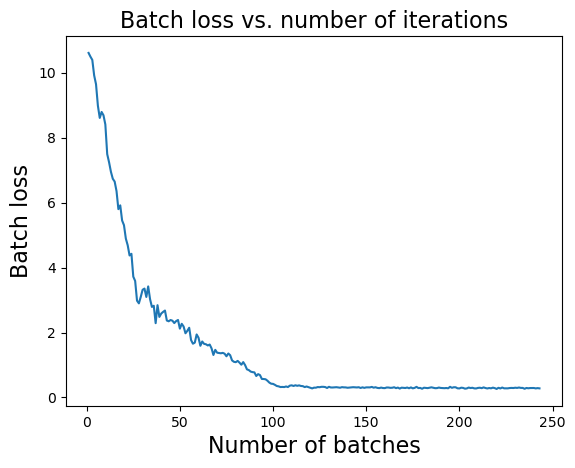

In [400]:
import matplotlib.pyplot as plt
iterations = list(range(1, len(batch_losses) + 1))
plt.plot(iterations, batch_losses)
plt.xlabel('Number of batches', fontsize = 16)
plt.ylabel('Batch loss', fontsize = 16)
plt.title('Batch loss vs. number of iterations', fontsize = 16)

Now that we have a neural network segmentor model that takes as input three-dimensional RGB vectors that define each pixel in an image and outputs a distribution over the possible classes that that pixel could belong to, we can apply it to predict class labels for tiles from the training set, and/or ideally, an unseen validation or test set.

Select and load image mask pairs to run through the NN segmentor network. 

In [369]:
def mine_highest_entropy_tile(image: np.ndarray,
                              mask: np.ndarray,
                              tile_size: int = 512) -> Tuple[float, float, np.ndarray, np.ndarray, List[float]]:
    """
    Mine highest entropy tile from an image and mask pair. The tile will have the
    highest entropy with respect to the distribution of classes present in the
    corresponding mask. The algorithm will repetitively calculate the entropy
    for each tile and update the max_entropy_tile and max_entropy_tile_mask as
    and when a tile with higher entropy is encountered.
    
    Parameters
    -----------
    image: np.ndarray
        The image of arbitrary size
    
    mask: np.ndarray
        The mask with the same dimensionality
        as the image.
    
    tile_size: int
        The size of the square tiles to extract
        from the image. (Default = 512)
    
    Returns
    --------
    Tuple[float, float, np.ndarray, np.ndarray, List[float]]
    
    Returns the following from the tile-wise scan:
    
    max_entropy: float
        The maximum entropy of all the tiles of size tile_size x tile_size
        that are available in the image.
    
    min_entropy: float
        The minimum entropy of all the tiles of size tile_size x tile_size
        that are available in the image.
    
    max_entropy_tile: np.ndarray
        The maximum entropy tile from all the tiles scanned. This is 
        a numpy array of size tile_size x tile_size. 
    
    max_entropy_tile_mask: np.ndarray
        The maximum entropy tile mask scanned from all the tile masks.
        It has the same coordinates as the max_entropy_tile, and is
        of shape tile_size x tile_size. 
    
    tile_class_distribution_entropies: List[float]
        The entropy values of all the tiles scanned. 
    """
    
    max_entropy = -np.inf
    max_entropy_tile = None
    max_entropy_tile_mask = None
    n_tiles_scanned = 0
    available_classes = list(putil.enlist_class_presence(mask))
    tile_class_distribution_entropies = []
    
    R, C, n_channels = image.shape
    for i in range(0, R, tile_size):
        for j in range(0, C, tile_size):
            try:
                tile = image[i: i + tile_size, j: j + tile_size, :]
                if tile.shape == (tile_size, tile_size, n_channels):
                    n_tiles_scanned += 1
                    tile_mask = mask[i: i + tile_size, j: j + tile_size, :]
                    class_distribution = putil.summarize_class_distribution(tile_mask)
                    current_tile_entropy = entropy(list(class_distribution.values()))
                    tile_class_distribution_entropies.append(current_tile_entropy)
                    
                    if current_tile_entropy > max_entropy:
                        max_entropy = current_tile_entropy
                        max_entropy_tile = tile
                        max_entropy_tile_mask = tile_mask
            except IndexError:
                print(f"Skipping tile at position ({i}, {j}) because it is out of bounds.")
    
    min_entropy = min(tile_class_distribution_entropies)
    assert max_entropy == max(tile_class_distribution_entropies)
    
    max_entropy_tile_classes = set(list(putil.enlist_class_presence(max_entropy_tile_mask)))
    
    print(f"Number of {tile_size}-sized tiles scanned: {n_tiles_scanned}")
            
    return max_entropy, min_entropy, max_entropy_tile, max_entropy_tile_mask, tile_class_distribution_entropies

Load and read the first image and mask pair

In [337]:
image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_files[0]))
mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_files[0]))

In [338]:
print(image.shape)

(25344, 5888, 3)


In [339]:
print(mask.shape)

(25344, 5888, 3)


Extract max entropy image and corresponding tile out of the image.

In [340]:
_, _, max_entropy_tile, max_entropy_tile_mask, _ = mine_highest_entropy_tile(image = image,
                                                                             mask = mask,
                                                                             tile_size = 512)

Number of 512-sized tiles scanned: 539


Print shapes of max entropy tile and max entropy tile masks

In [341]:
print(max_entropy_tile.shape)

(512, 512, 3)


In [342]:
print(max_entropy_tile_mask.shape)

(512, 512, 3)


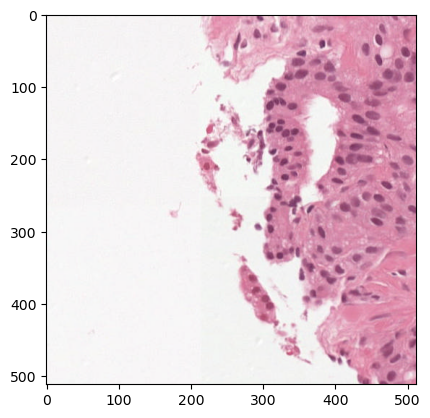

In [343]:
plt.imshow(max_entropy_tile)

Enlist class presence and distribution in the max entropy tile and max entropy tile mask

In [344]:
putil.enlist_class_presence(max_entropy_tile_mask)

array([0, 1, 4], dtype=uint8)

In [345]:
putil.summarize_class_distribution(max_entropy_tile_mask)

{np.uint8(0): np.float64(0.26),
 np.uint8(1): np.float64(0.46),
 np.uint8(4): np.float64(0.27)}

In [346]:
def draw_mask(image: np.ndarray, 
              mask: np.ndarray,
              color_rgb_list: List[int] = [0, 255, 0]):
    
    """
    Function to draw mask on an image based on the
    mask given (mask). The mask will be translucent
    green given the default color in color_rgb_list = [0, 225, 0]
    
    Parameters
    -----------
    image: np.ndarray
        The image over which the mask is to be overlayed
    
    mask: np.ndarray
        The mask that is to be overlayed on the image. 
        This mask must be boolean (containing only True or False)
        
    color_rgb_list: List[int]
        The RGB pixel configuration of the color of the translucent
        mask to overlay on the image. 
        Default = [0, 255, 0] (green)
    
    Returns
    ---------
    np.ndarray
        The image with the colored mask overlaid along the 
        pixel locations which indicate True in the mask. 
    
    """
    
    masked_image = image.copy()
    masked_image = np.where(mask.astype(int),
                            np.array(color_rgb_list, dtype='uint8'),
                            masked_image)

    masked_image = masked_image.astype(np.uint8)

    return cv2.addWeighted(image, 0.3, masked_image, 0.7, 0)

In [347]:
def apply_segment_to_image_by_label(image,
                                    mask,
                                    label_id,
                                    color_lst):
    
    """
    Function to apply segmentation mask to image
    for a specific label_id
    
    Parameters
    -----------
    image: np.ndarray
        The image to which the segmentation mask is to
        be applied for that specific label_id
    
    mask: np.ndarray
        The mask which is to be applied to the image
        where the label_id is present
    
    label_id: int
        The label_id that is to be applied to the
        image from the segmentation mask
    
    color_lst: List[int]
        The color, expressed as list of RGB integer values,
        to be applied to the image where the label_id is
        present in the corresponding segmentation mask
    
    Returns
    --------
    np.ndarray
        The image with the segmentation mask applied
        at the pixel locations where label_id is present
        
    """
    
    avail_labels = list(putil.enlist_class_presence(mask))
    #assert label_id in avail_labels
    
    assert image.shape == mask.shape
    assert image.shape[-1] == 3 and mask.shape[-1] == 3
    
    assert np.sum(mask[:,:,1]) == 0 and np.sum(mask[:,:,2]) == 0
    
    if np.sum(mask[:,:,0]) == 0:
        print("The image is all background")
    
    reduced_mask = mask[:, :, 0]
    assert len(reduced_mask.shape) == 2
    
    assert set(list(np.unique(reduced_mask))) == set(avail_labels)
    
    boolean_label_mask = reduced_mask == label_id
    assert (reduced_mask == label_id).sum() == boolean_label_mask.sum()
    
    n_on_bits_for_label = (reduced_mask == label_id).sum()
    
    boolean_label_mask_3d = np.repeat(boolean_label_mask[:, :, np.newaxis], 3, axis=2)
    
    for i in range(3):
        assert np.sum(boolean_label_mask_3d[:, :, i]) == n_on_bits_for_label
        
    segmented_image = draw_mask(image, boolean_label_mask_3d, color_rgb_list = color_lst)
    
    return segmented_image

In [348]:
def apply_segment_to_image_by_multiple_labels(image: np.ndarray,
                                              mask: np.ndarray,
                                              label_ids: List[int],
                                              color_rgb_pixels: List[list[int,int,int]] = [[0, 255, 0],
                                                                                           [255, 0, 0],
                                                                                           [0, 0, 255],
                                                                                           [255, 255, 0],
                                                                                           [255, 0, 255],
                                                                                           [0, 255, 255],
                                                                                           [255, 165, 0],
                                                                                           [128, 0, 128]],
                                              colors: List[str] = ["green",
                                                                    "red",
                                                                    "blue",
                                                                    "yellow",
                                                                    "magenta",
                                                                     "cyan",
                                                                    "orange",
                                                                     "purple"],
                                              
                                              id_to_class: Dict[int, str] = {0:"background (non tissue) or unknown",
                                                                             1:"stroma (connective tissue, non-epithelium tissue)",
                                                                             2: "healthy (benign) epithelium",
                                                                             3: "cancerous epithelium (Gleason 3)",
                                                                             4: "cancerous epithelium (Gleason 4)",
                                                                             5: "cancerous epithelium (Gleason 5)"},
                                               print_color: bool = False) -> np.ndarray:
    
    for i in range(len(label_ids)):
        image = apply_segment_to_image_by_label(image = image,
                                                mask = mask,
                                                label_id = label_ids[i],
                                                color_lst = color_rgb_pixels[i])
        if print_color:
            print(f"{colors[i]} : {id_to_class[label_ids[i]]}")
    
    return image

In [370]:
gt_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                               mask = max_entropy_tile_mask,
                                                               label_ids = [0, 1, 4])

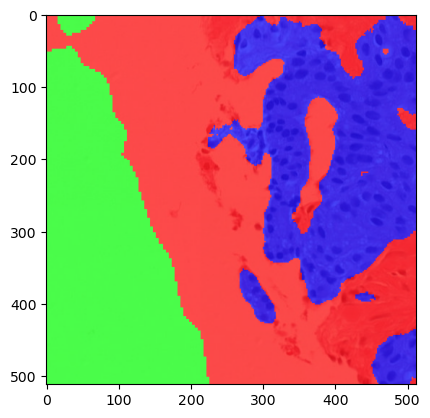

In [371]:
plt.imshow(gt_segmented_image)

Cast the shape and dimensions of the max entropy tile to make it compatible with nn_segmentor

In [372]:
casted_tile = torch.from_numpy(max_entropy_tile.reshape(-1, 3))

In [373]:
print(casted_tile.shape)

torch.Size([262144, 3])


Pass the casted tile through the nn segmentor model

In [401]:
nn_segmenter.eval()
logits = nn_segmenter(casted_tile.to(torch.float32))

Print the shape of the logits tensor

In [402]:
print(logits.shape)

torch.Size([262144, 6])


Now that we have obtained the logits, we will take the maximum along each position (row index) from the tensor in order to assign a class label to each pixel, indicated by the rows in the logits tensor

In [403]:
arg_logits = torch.argmax(logits, dim=1, keepdim=True)

In [356]:
arg_logits.shape

torch.Size([262144, 1])

Cast the arg_logits to numpy array

In [404]:
arg_logits = arg_logits.numpy()

Print the type of arg_logits to ensure correct conversion

In [358]:
type(arg_logits)

numpy.ndarray

Print the shape of arg_logits

In [359]:
arg_logits.shape

(262144, 1)

Print the type of classes found in arg_logits

In [405]:
np.unique(arg_logits)

array([0, 1, 4])

Re-cast the arg_logits into a mask to apply it to the original image

In [406]:
nn_mask = arg_logits.reshape(512, 512)
processed_nn_mask = np.zeros((512, 512, 3))
processed_nn_mask[:, :, 0] = nn_mask

In [380]:
print(processed_nn_mask.shape)

(512, 512, 3)


In [407]:
nn_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                               mask = processed_nn_mask,
                                                               label_ids = [0, 1, 4])

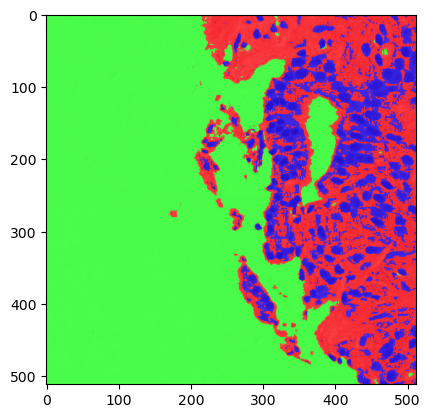

In [408]:
plt.imshow(nn_segmented_image)

Write function to plot the ground truth and neural network predicted segmentation masks for maximum entropy tiles mined from various different images

In [409]:
def plot_gt_nn_segmentation_results(input_image: np.ndarray,
                                    input_mask: np.ndarray,
                                    tile_size: int = 512):
    
    _, _, max_entropy_tile, max_entropy_tile_mask, _ = mine_highest_entropy_tile(image = input_image,
                                                                                 mask = input_mask,
                                                                                 tile_size = tile_size)
    
    label_ids = list(putil.enlist_class_presence(max_entropy_tile_mask))
    
    gt_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                                   mask = max_entropy_tile_mask,
                                                                   label_ids = label_ids,
                                                                   print_color = True)
    
    casted_tile = torch.from_numpy(max_entropy_tile.reshape(-1, 3))
    
    nn_segmenter.eval()
    logits = nn_segmenter(casted_tile.to(torch.float32))
    
    arg_logits = torch.argmax(logits, dim=1, keepdim=True)
    
    arg_logits = arg_logits.numpy()
    
    nn_label_ids = list(np.unique(arg_logits))
    
    nn_mask = arg_logits.reshape(tile_size, tile_size)
    processed_nn_mask = np.zeros((tile_size, tile_size, 3))
    processed_nn_mask[:, :, 0] = nn_mask
    
    nn_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                                   mask = processed_nn_mask,
                                                                   label_ids = nn_label_ids)
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 6))

    ax[0].imshow(max_entropy_tile)
    ax[0].set_title('Original Image')  
    ax[0].axis('off')  

    ax[1].imshow(gt_segmented_image)
    ax[1].set_title(f'Ground Truth Segmented Image')  
    ax[1].axis('off')  

    ax[2].imshow(nn_segmented_image)
    ax[2].set_title(f'MLP Classifier Segmented Image')  
    ax[2].axis('off')  


    plt.tight_layout()

    plt.show()

Number of 512-sized tiles scanned: 539
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


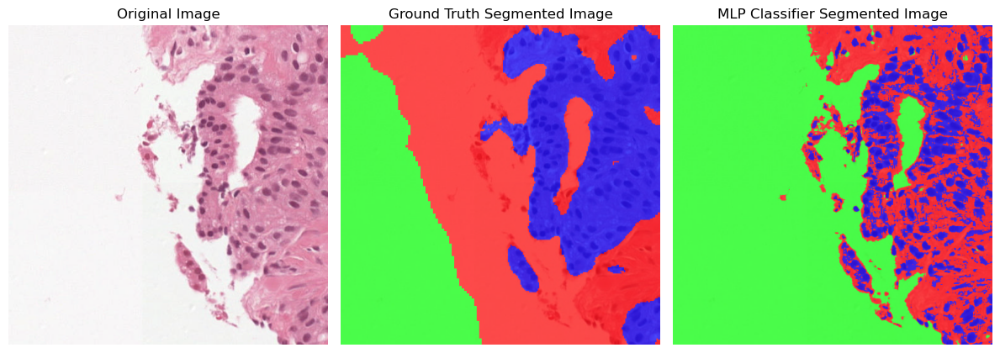

In [410]:
mask_file = mask_files[0]
image_file = image_files[0]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 704
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


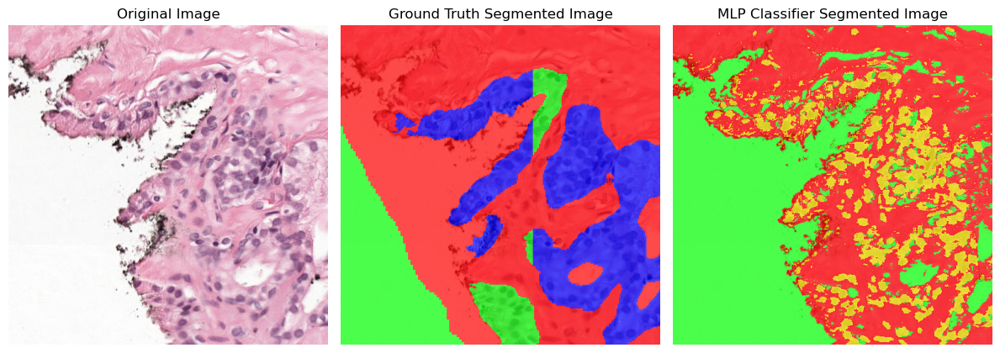

In [412]:
mask_file = mask_files[1]
image_file = image_files[1]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 260
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


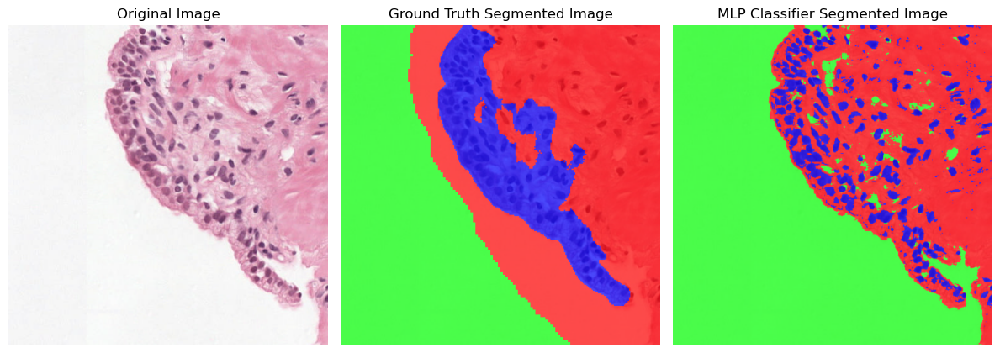

In [413]:
mask_file = mask_files[2]
image_file = image_files[2]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 60
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


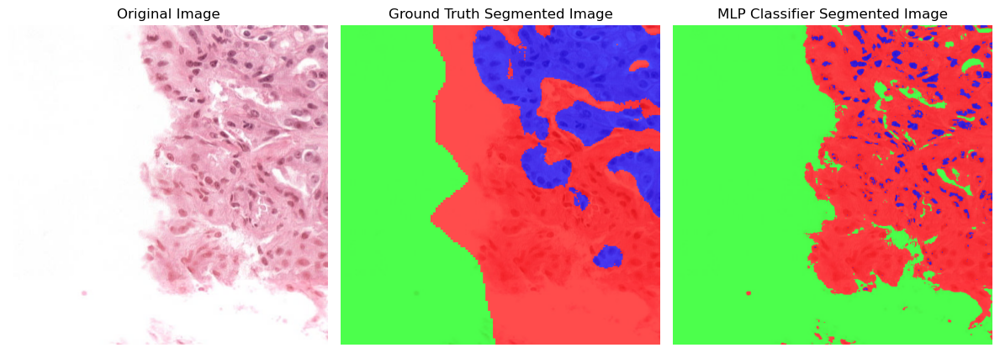

In [414]:
mask_file = mask_files[3]
image_file = image_files[3]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 846
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


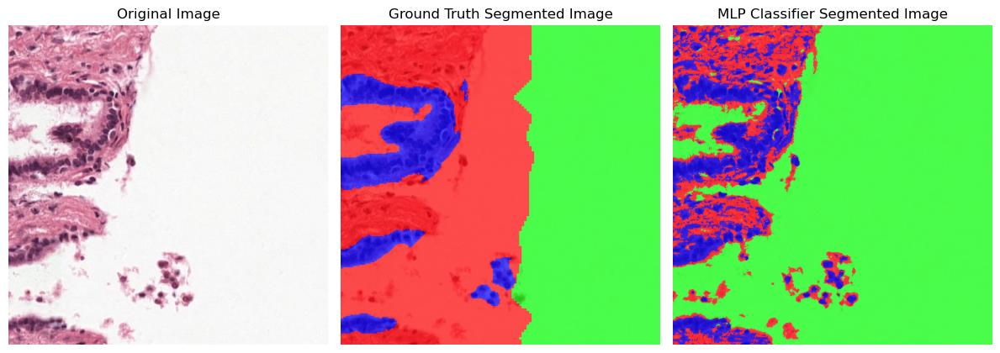

In [415]:
mask_file = mask_files[4]
image_file = image_files[4]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 667
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


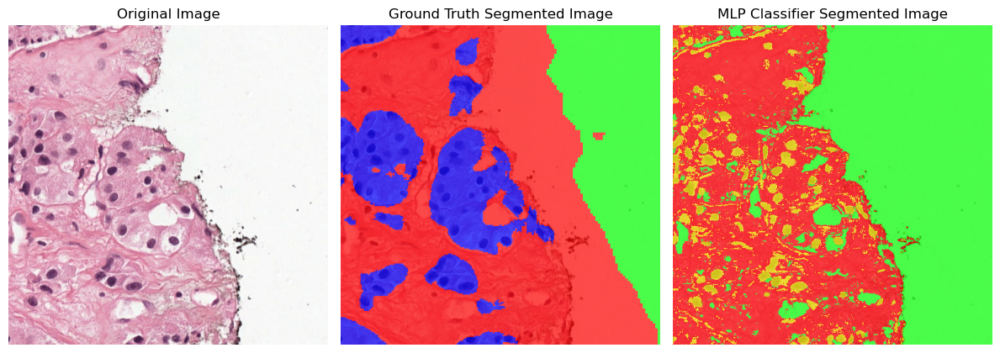

In [416]:
mask_file = mask_files[5]
image_file = image_files[5]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 782
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


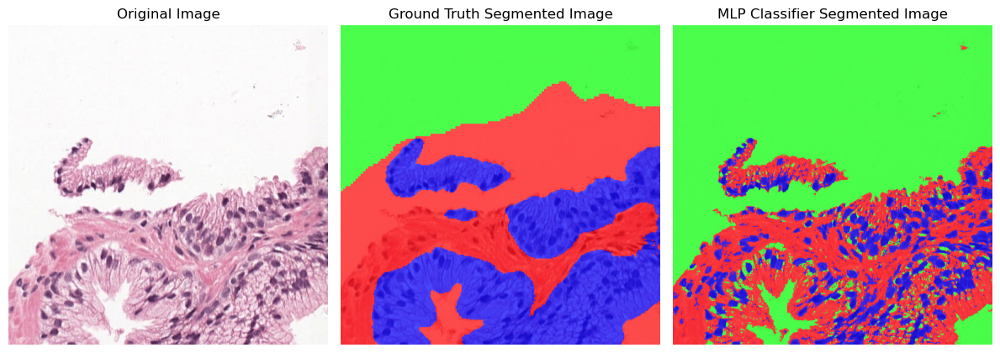

In [417]:
mask_file = mask_files[6]
image_file = image_files[6]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 1491
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium
yellow : cancerous epithelium (Gleason 5)


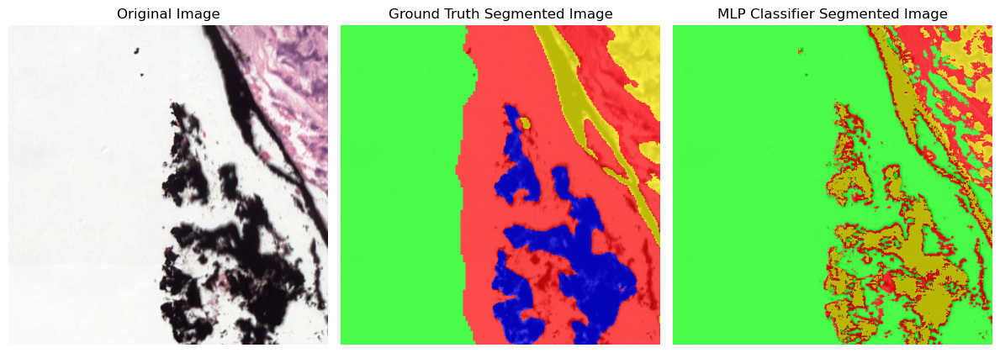

In [418]:
mask_file = mask_files[7]
image_file = image_files[7]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 352
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


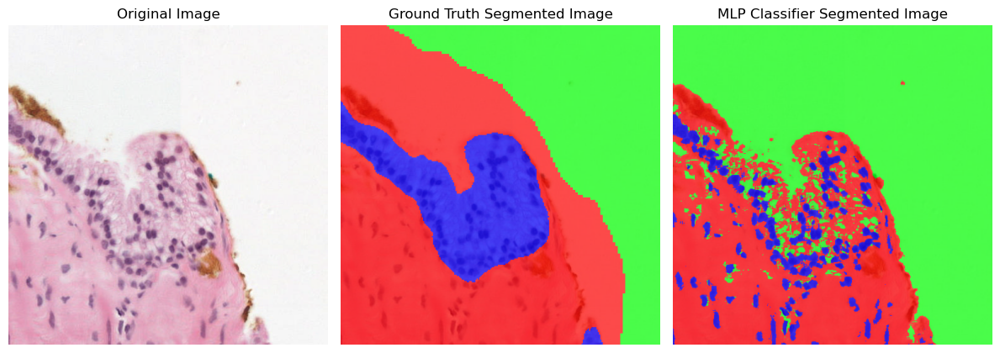

In [419]:
mask_file = mask_files[8]
image_file = image_files[8]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 1440
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


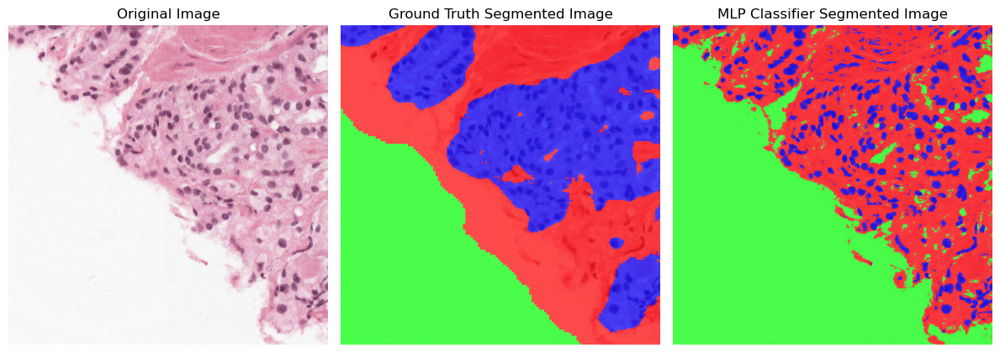

In [420]:
mask_file = mask_files[9]
image_file = image_files[9]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 2938
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


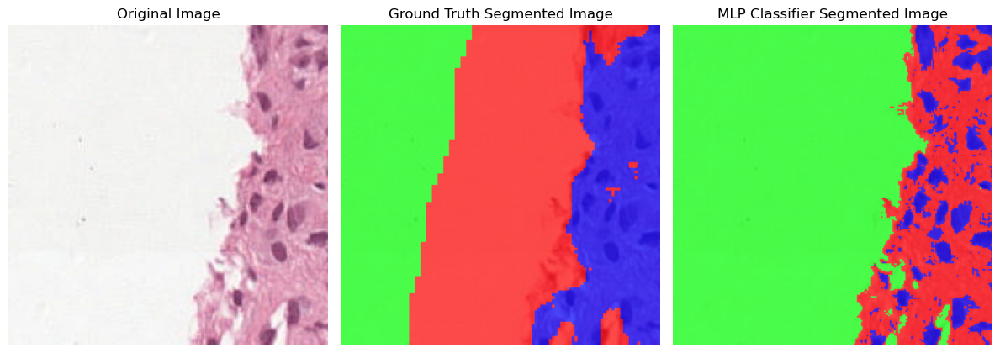

In [421]:
mask_file = mask_files[0]
image_file = image_files[0]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 3600
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


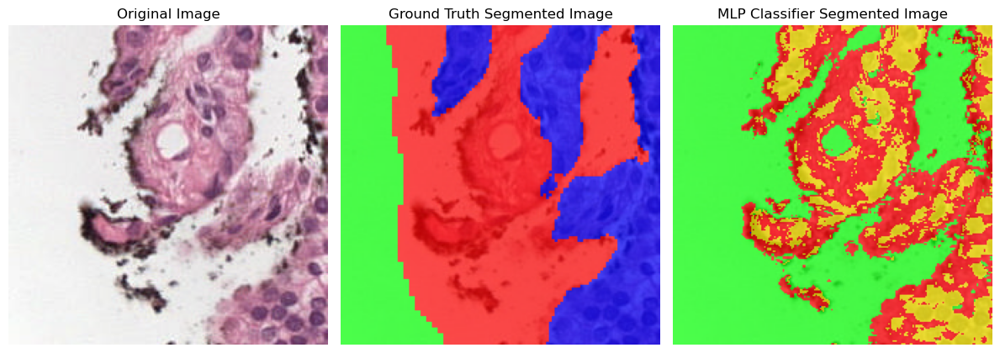

In [422]:
mask_file = mask_files[1]
image_file = image_files[1]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 1380
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


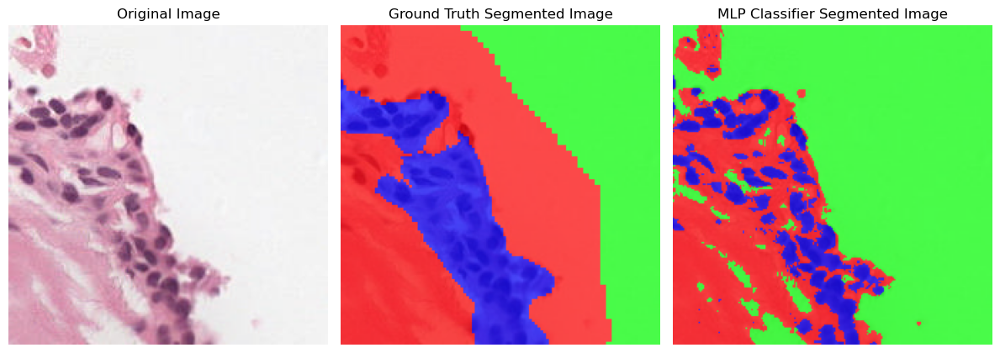

In [423]:
mask_file = mask_files[2]
image_file = image_files[2]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 306
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 3)
yellow : cancerous epithelium (Gleason 4)


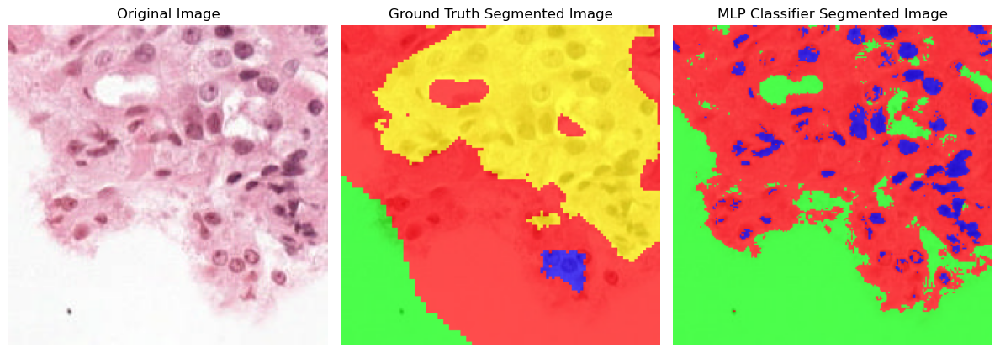

In [424]:
mask_file = mask_files[3]
image_file = image_files[3]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 4536
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


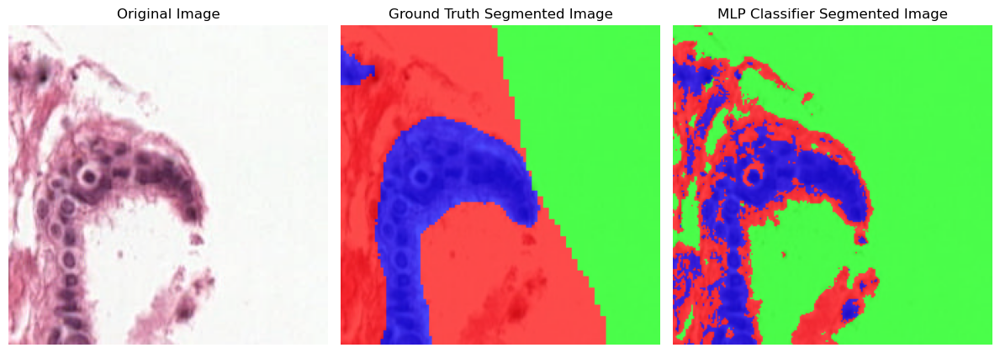

In [425]:
mask_file = mask_files[4]
image_file = image_files[4]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 3432
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


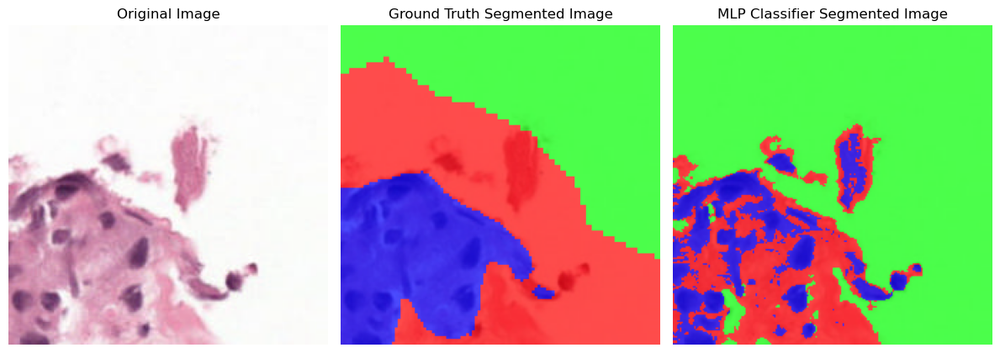

In [426]:
mask_file = mask_files[5]
image_file = image_files[5]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 4028
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


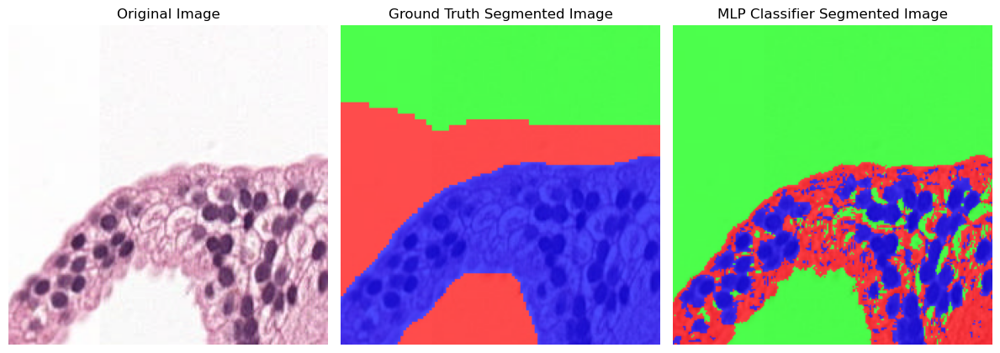

In [427]:
mask_file = mask_files[6]
image_file = image_files[6]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 7776
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium
yellow : cancerous epithelium (Gleason 5)


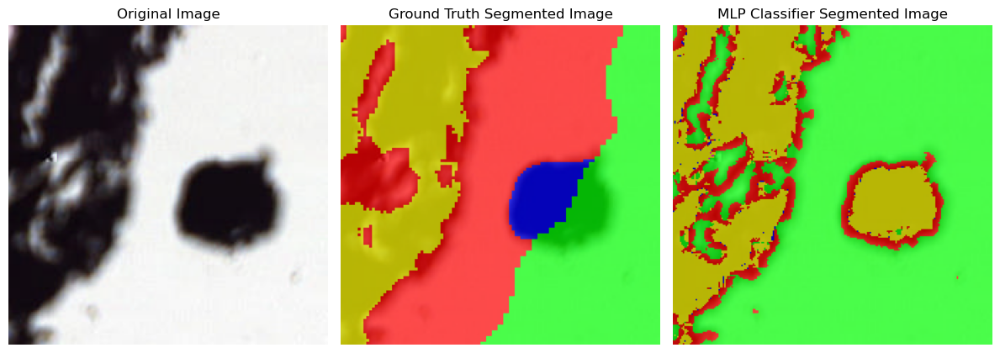

In [428]:
mask_file = mask_files[7]
image_file = image_files[7]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 1836
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 3)


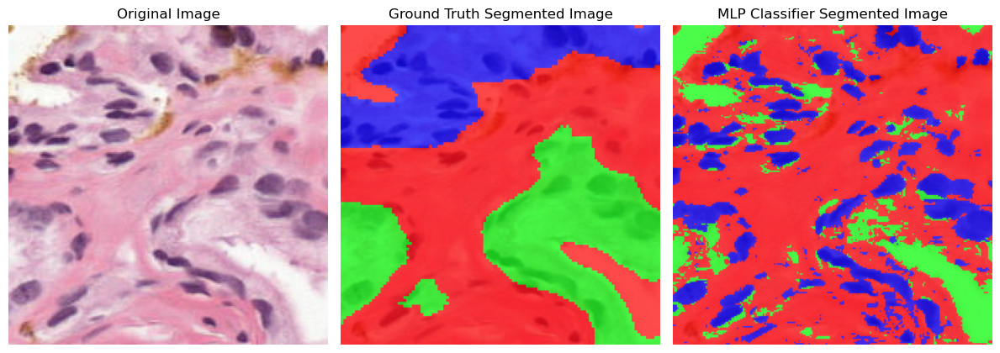

In [429]:
mask_file = mask_files[8]
image_file = image_files[8]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 7636
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


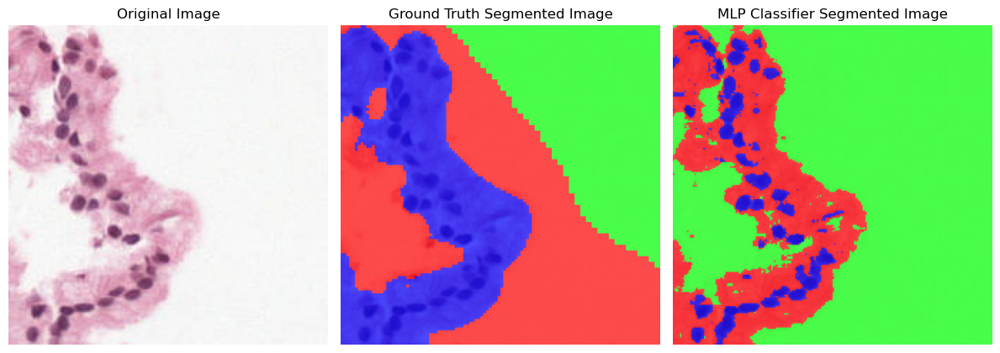

In [430]:
mask_file = mask_files[9]
image_file = image_files[9]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)